In [1]:
import numpy as np
from time import time
from skimage import io
%matplotlib inline
import matplotlib.pyplot as plt

## Problem 1 Image filtering [15 pts]

### Problem 1.1 Implementing Convolution[5 pts]


In this problem, you will implement the convolution filtering operation using NumPy functions, but without using the NumPy convolve function directly.

As shown in the lecture, a convolution can be considered as a sliding window that computes a sum of the pixel values weighted by the flipped kernel. Your version will i) zero-pad an image, ii) flip the kernel horizontally and vertically, and iii) compute a weighted sum of the neighborhood at each pixel.

#### Problem 1.1.1  [1 pts]
First you will want to implement the **zero_pad** function.

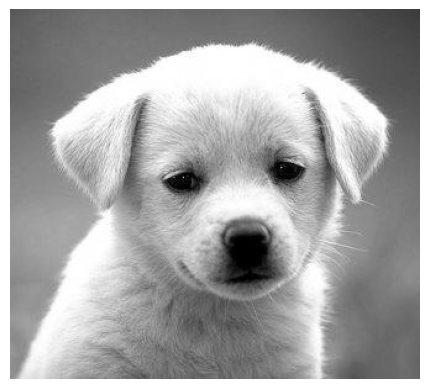

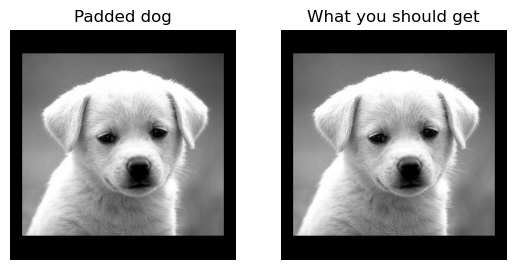

In [2]:
def zero_pad(image, pad_top, pad_down, pad_left, pad_right):
    """ Zero-pad an image.

    Ex: a 1x1 image [[1]] with pad_top = 1, pad_down = 1, pad_left = 2, pad_right = 2 becomes:

        [[0, 0, 0, 0, 0],
         [0, 0, 1, 0, 0],
         [0, 0, 0, 0, 0]]         of shape (3, 5)

    Args:
        image: numpy array of shape (H, W)
        pad_left: width of the zero padding to the left of the first column
        pad_right: width of the zero padding to the right of the last column
        pad_top: height of the zero padding above the first row
        pad_down: height of the zero padding below the last row

    Returns:
        out: numpy array of shape (H + pad_top + pad_down, W + pad_left + pad_right)
    """
    """ ==========
    YOUR CODE HERE
    ========== """
    
    height, width = image.shape
    out = np.zeros((height + pad_top + pad_down, 
                    width + pad_left + pad_right))
    out[pad_top:pad_top+height , pad_left:pad_left+width] = image
    return out

# Open image as grayscale
img = io.imread('dog.jpg', as_gray=True)

# Show image
plt.imshow(img,cmap='gray')
plt.axis('off')
plt.show()

pad_width = 20 # width of the padding on the left and right
pad_height = 40 # height of the padding on the top and bottom

padded_img = zero_pad(img, pad_height, pad_height, pad_width, pad_width)

# Plot your padded dog
plt.subplot(1,2,1)
plt.imshow(padded_img,cmap='gray')
plt.title('Padded dog')
plt.axis('off')

# Plot what you should get
solution_img = io.imread('padded_dog.jpg', as_gray=True)
plt.subplot(1,2,2)
plt.imshow(solution_img,cmap='gray')
plt.title('What you should get')
plt.axis('off')

plt.show()

#### Problem 1.1.2 [2 pts]
Now implement the function **`conv`**, **using at most 2 loops**. This function should take an image $f$ and a kernel $h$ as inputs and output the convolved image $(f*h)$ that has the same shape as the input image (use zero padding to accomplish this). We will only be using kernels with odd width and odd height. Depending on the computer, your implementation should take around a second or less to run.


took 0.227452 seconds.


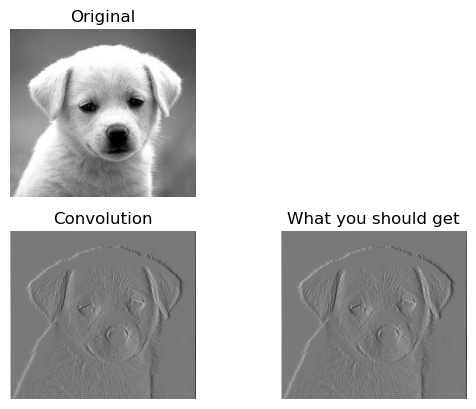

In [3]:
def conv(image, kernel):
    """ An efficient implementation of a convolution filter.

    This function uses element-wise multiplication and np.sum()
    to efficiently compute a weighted sum of the neighborhood at each
    pixel.

    Hints:
        - Use the zero_pad function you implemented above
        - You should need at most two nested for-loops
        - You may find np.flip() and np.sum() useful
        - You need to handle both odd and even kernel size

    Args:
        image: numpy array of shape (Hi, Wi)
        kernel: numpy array of shape (Hk, Wk)

    Returns:
        out: numpy array of shape (Hi, Wi)
    """
    Hi, Wi = image.shape
    Hk, Wk = kernel.shape
    out = np.zeros((Hi, Wi))
    K = np.flip(np.flip(kernel, axis=0), axis=1)

    # pad the image
    top_pad = int(Hk/2)  ; down_pad = int(Hk/2)
    left_pad = int(Wk/2) ; right_pad = int(Wk/2)
    padded_image = zero_pad(image, top_pad, down_pad, left_pad, right_pad)
    for i in range(Hi):
        for j in range(Wi):
            img = padded_image[i:i+Hk, j:j+Wk]
            temp = np.multiply(img, K)
            temp = np.sum(temp)
            out[i, j] = temp
    
    """ ==========
    YOUR CODE HERE
    ========== """
    

    return out

# Simple convolution kernel.
kernel = np.array(
[
    [1,0,-1],
    [2,0,-2],
    [1,0,-1]
])

t1 = time()
out = conv(img, kernel)
t2 = time()
print("took %f seconds." % (t2 - t1))

# Plot original image
plt.subplot(2,2,1)
plt.imshow(img,cmap='gray')
plt.title('Original')
plt.axis('off')

# Plot your convolved image
plt.subplot(2,2,3)
plt.imshow(out,cmap='gray')

plt.title('Convolution')
plt.axis('off')

# Plot what you should get
solution_img = io.imread('convolved_dog.jpg', as_gray=True)
plt.subplot(2,2,4)
plt.imshow(solution_img,cmap='gray')
plt.title('What you should get')
plt.axis('off')

plt.show()

#### Problem 1.1.3 [1 pt]
Now let's filter some images! Here, you will apply the convolution function that you just implemented in order to bring about some interesting image effects. More specifically, we will use convolution to blur and sharpen our images.

First we will apply convolution for image blurring. To accomplish this, convolve the dog image with a 13x13 Gaussian filter for $\sigma = 2.0$. You can use the included function to obtain the Gaussian kernel.

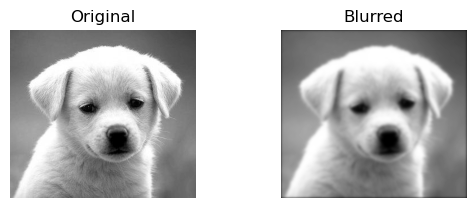

In [4]:
def gaussian2d(sig):
    """
    Creates 2D Gaussian kernel with a sigma of `sig`.
    """
    filter_size = int(sig * 6)
    if filter_size % 2 == 0:
        filter_size += 1
        
    ax = np.arange(-filter_size // 2 + 1., filter_size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))
    return kernel / np.sum(kernel)

def blur_image(img):
    """Blur the image by convolving with a Gaussian filter."""
    blurred_img = np.zeros_like(img)
    """ ==========
    YOUR CODE HERE
    ========== """
    kernel = gaussian2d(2)
    blurred_img = conv(img, kernel)
    assert blurred_img.shape == img.shape
    return blurred_img

# Plot original image
plt.subplot(2,2,1)
plt.imshow(img,cmap='gray')
plt.title('Original')
plt.axis('off')

# Plot blurred image
plt.subplot(2,2,2)
plt.imshow(blur_image(img),cmap='gray')
plt.title('Blurred')
plt.axis('off')

plt.show()

#### Problem 1.1.4 [1 pt]
Next, we will use convolution to sharpen the images. Convolve the image with the following filter to produce a sharpened result. For convenience, we have defined the filter for you:


In [5]:
sharpening_kernel = np.array([
    [1, 4,     6,  4, 1],
    [4, 16,   24, 16, 4],
    [6, 24, -476, 24, 6],
    [4, 16,   24, 16, 4],
    [1,  4,    6,  4, 1],
]) * -1.0 / 256.0

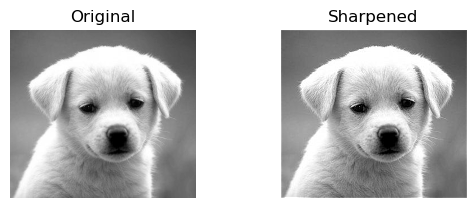

In [6]:
def sharpen_image(img):
    """Sharpen the image by convolving with a sharpening filter."""
    sharpened_img = np.zeros_like(img)
    """ ==========
    YOUR CODE HERE
    ========== """
    sharpened_img = conv(img, sharpening_kernel)
    assert sharpened_img.shape == img.shape
    return sharpened_img

# Plot original image
plt.subplot(2,2,1)
plt.imshow(img, vmin=0.0, vmax=1.0,cmap='gray')
plt.title('Original')
plt.axis('off')

# Plot sharpened image
plt.subplot(2,2,2)
plt.imshow(sharpen_image(img), vmin=0.0, vmax=1.0,cmap='gray')
plt.title('Sharpened')
plt.axis('off')

plt.show()

### Problem 1.2: Convolution Theory  [5 pts]
#### Problem 1.2.1 [2 pts]
Consider (1) smoothing an image with a 3x3 box filter and then computing the derivative in the y-direction. Also consider (2) computing the derivative first, then smoothing. What is a single convolution kernel that will simultaneously implement both (1) and (2)? Try to give a brief justification for how you arrived at the kernel. (Hint: See shape full convolution)

Use the y-derivative filter  $$[-1/2,0,1/2]^T$$ for this problem.

The above kernel is the correlation kernel, we need to first get the convolution kernel like the following:
$$[1/2,0,-1/2]^T$$

Then, we can convolve the box filter with the y-derivative convolution filter.  
We assume the box filter is like the following:
$$
\begin{bmatrix}
1/9 & 1/9 & 1/9 \\
1/9 & 1/9 & 1/9 \\
1/9 & 1/9 & 1/9 \\
\end{bmatrix}
$$
To do shape full convolution, we can pad the above filter like the following:
$$
\begin{bmatrix}
0 & 0 & 0 \\
0 & 0 & 0 \\
1/9 & 1/9 & 1/9 \\
1/9 & 1/9 & 1/9 \\
1/9 & 1/9 & 1/9 \\
0 & 0 & 0 \\
0 & 0 & 0 \\
\end{bmatrix}
$$
Then, we can convolve the above padded filter with y-derivative filter. The resulting single convolution filter is the following
$$
\begin{bmatrix}
1/18 & 1/18 & 1/18 \\
1/18 & 1/18 & 1/18 \\
0 & 0 & 0 \\
-1/18 & -1/18 & -1/18 \\
-1/18 & -1/18 & -1/18 \\
\end{bmatrix}
$$

#### Problem 1.2.2 [3 pts]
Certain 2D filters can be expressed as a convolution of two 1D filters. Such filters are called separable filters. Give an example of a 3 $\times$ 3 separable filter and compare the number of arithmetic operations it takes to
convolve an n $\times$ n image using that filter before and after separation. Count both, the number of multiplication and addition operations in each case.

Assume that the convolution of the image and filter is performed in "valid" mode, i.e., the image is not padded before convolution.

##### 2D filter Convolution
If we do valid convolution, then we need to move the filter window $(n-2)^2$ times. For each time moving the filter window, we need 9 multiplications and 8 additions. As a result, in total we need
* $9(n-2)^2$ multiplications
* $8(n-2)^2$ additions

##### 1D filter Convolution
To convolve with one 1D filter, we need to move the filter window $n(n-2)$ times. For each time moving the filter, we need 3 multiplications and 2 additions. Therefore, to convolve with one 1D filter, in total we need:
* $3n(n-2)$ multiplications
* $2n(n-2)$ additions

To convolve with two 1D filters, in total we need:
* $6n(n-2)$ multiplications
* $4n(n-2)$ additions

### Problem 1.3 Template Matching [5 pts]
Suppose that you are a clerk at a grocery store. One of your responsibilites is to check the shelves periodically and stock them up whenever there are sold-out items. You got tired of this laborious task and decided to build a computer vision system that keeps track of the items on the shelf.

Luckily, you have learned in CSE 252A (or are learning right now) that convolution can be used for template matching: a filpped template g is multiplied with regions of a larger image f to measure how similar each region is to the template. Note that you will want to flip the filter before giving it to your convolution function, so that it is overall not flipped when making comparisons. You will also want to subtract off the mean value of the image or template (whichever you choose, subtract the same value from both the image and template) so that our solution is not biased toward higher-intensity (white) regions.

The template of a product (template.jpg) and the image of the shelf (shelf.jpg) is provided. We will use convolution to find the product in the shelf.

<img src="template.jpg" alt="template" width="25px"/>
<img src="shelf.jpg" alt="shelf" width="600px"/>


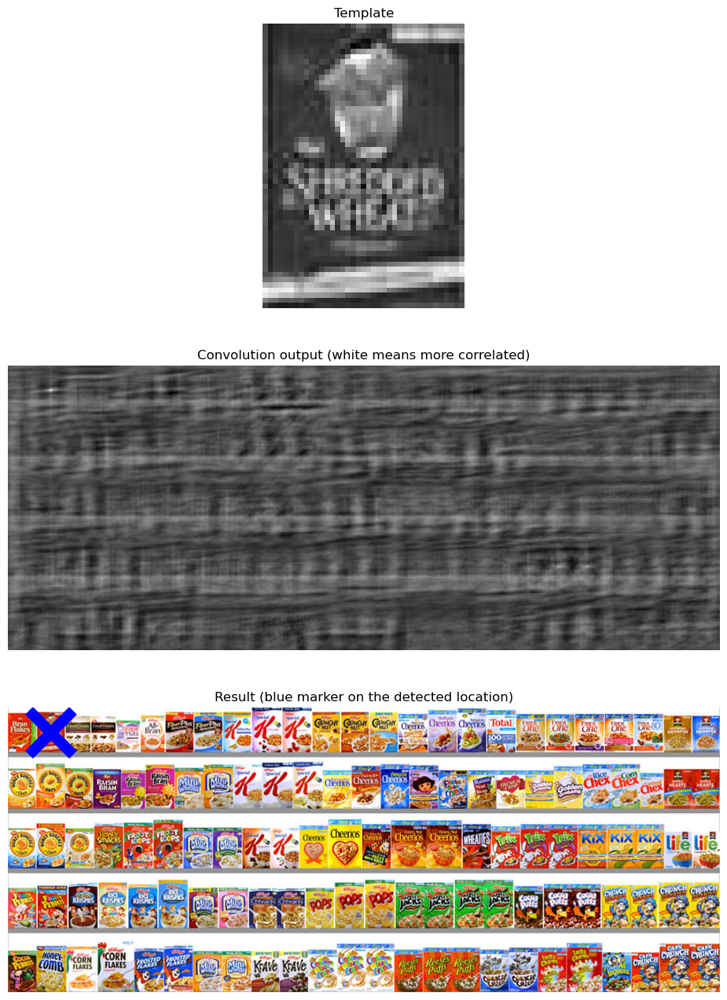

In [7]:
# Load template and image in grayscale
img = io.imread('shelf.jpg')
img_gray = io.imread('shelf.jpg', as_gray=True)
temp = io.imread('template.jpg')
temp_gray = io.imread('template.jpg', as_gray=True)

# Perform a convolution between the image (grayscale) and the template (grayscale) and store 
# the result in the out variable
""" ==========
YOUR CODE HERE
========== """

# calculate mean
mean = temp_gray.mean()

# subtract mean
img_gray -= mean
temp_gray -= mean

# prepare kernel
kernel = np.flip(np.flip(temp_gray, axis=0), axis=1)
out = conv(image=img_gray, kernel=kernel)

# find the index
index = out.argmax()
y, x = np.unravel_index(index, out.shape)

# Display product template
plt.figure(figsize=(20,16))
plt.subplot(3, 1, 1)
plt.imshow(temp_gray, cmap="gray")
plt.title('Template')
plt.axis('off')

# Display convolution output
plt.subplot(3, 1, 2)
plt.imshow(out, cmap="gray")
plt.title('Convolution output (white means more correlated)')
plt.axis('off')

# Display image
plt.subplot(3, 1, 3)
plt.imshow(img, cmap="gray")
plt.title('Result (blue marker on the detected location)')
plt.axis('off')

# Draw marker at detected location
plt.plot(x, y, 'bx', ms=40, mew=10)
plt.show()

## Problem 2: Edge detection [21 pts]

In this problem, you will write a function to perform Canny edge detection. The following steps need to be implemented.

### Problem 2.1 Smoothing [1 pt]
First, we need to smooth the images in order to prevent noise from being considered as edges. For this assignment, use a 9x9 Gaussian kernel filter with $\sigma = 1.5$ to smooth the images.

In [8]:
import copy
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy.signal import convolve
import scipy.ndimage as sciimg
%matplotlib inline

import matplotlib
matplotlib.rcParams['figure.figsize'] = [5, 5]

In [9]:
def gaussian2d(sig=None):
    """Creates a 2D Gaussian kernel with
    side length `filter_size` and a sigma of `sig`."""
    filter_size = int(sig * 6)
    if filter_size % 2 == 0:
        filter_size += 1
        
    ax = np.arange(-filter_size // 2 + 1., filter_size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))
    return kernel / np.sum(kernel)

In [10]:
def smooth(image):
    """ ==========
    YOUR CODE HERE
    ========== """
    gaussian_kernel = gaussian2d(sig=1.5)
    image_ = copy.deepcopy(image)
    out = conv(image_, gaussian_kernel)
    assert out.shape == image.shape
    return out

Original:


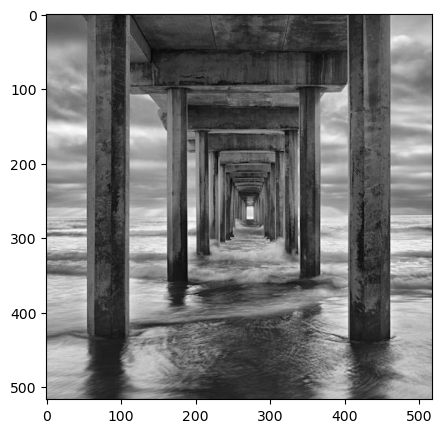

Smoothed:


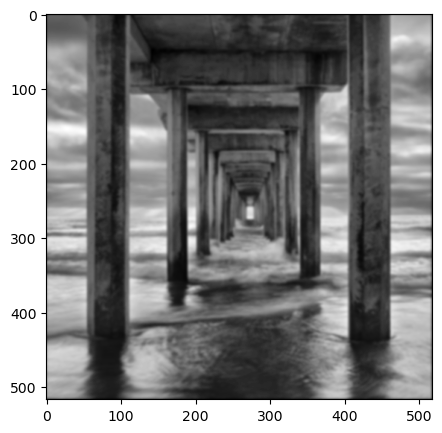

In [11]:
# Load image in grayscale
image = io.imread('sio_pier.jpg', as_gray=True)
assert len(image.shape) == 2, 'image should be grayscale; check your Python/skimage versions'
smoothed = smooth(image)
print('Original:')
plt.imshow(image, cmap=cm.gray)
plt.show()

print('Smoothed:')
plt.imshow(smoothed, cmap=cm.gray)
plt.show()

### Problem 2.2 Gradient Computation [5 pts]
After you have finished smoothing, find the image gradient in the horizontal and vertical directions. Compute the gradient magnitude image as $|G| = \sqrt{G_x^2 + G_y^2}$. The edge direction for each pixel is given by $G_\theta = \tan^{-1}\left(\frac{G_y}{G_x}\right)$.

In [12]:
def gradient(image):
    
    # define kernels
    x_derivative_kernel = np.array([[-1/2, 0, 1/2]])
    x_derivative_kernel = np.flip(np.flip(x_derivative_kernel, axis=0), axis=1)
    y_derivative_kernel = np.array([[-1/2], [0], [1/2]])
    y_derivative_kernel = np.flip(np.flip(y_derivative_kernel, axis=0), axis=1)
    
    image_ = copy.deepcopy(image)

    Gx = convolve(image_, x_derivative_kernel, mode='valid') ; Gx = zero_pad(Gx, 0, 0, 1, 1)
    Gy = convolve(image_, y_derivative_kernel, mode='valid') ; Gy = zero_pad(Gy, 1, 1, 0, 0)
    
    assert Gx.shape == image.shape
    assert Gy.shape == image.shape
    
    
    g_mag = np.hypot(Gx, Gy)
    g_theta = np.arctan2(Gy, Gx)
    
    return g_mag, g_theta

Gradient magnitude:


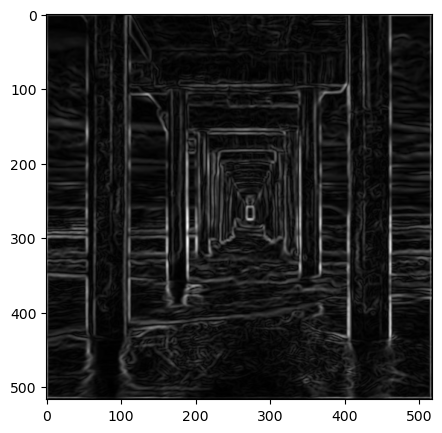

In [13]:
g_mag, g_theta = gradient(smoothed)
print('Gradient magnitude:')
plt.imshow(g_mag, cmap=cm.gray)
plt.show()

### Problem 2.3 Non-Maximum Suppression [7 pts]
We would like our edges to be sharp, unlike the ones in the gradient image. Use non-maximum suppression to preserve all local maxima and discard the rest. You can use the following method to do so:

  - For each pixel in the gradient magnitude image:
    - Round the gradient direction $\theta$ to the nearest multiple of $45^{\circ}$ (which we will refer to as $ve$).
    - Compare the edge strength at the current pixel to the pixels along the $+ve$ and $-ve$ gradient direction in the 8-connected neighborhood.
    - If the pixel does not have a larger value than both of its two neighbors in the $+ve$ and $-ve$ gradient directions, suppress the pixel's value (set it to 0). By following this process, we preserve the values of only those pixels which have maximum gradient magnitudes in the neighborhood along the $+ve$ and $-ve$ gradient directions.
  - Return the result as the NMS response.

In [14]:
# given index coordinate, tell if this index is within the rang 
def isIn(i, j, height, width):
    if (i >= 0) and (i <= height -1) and (j >= 0) and (j <= width - 1):
        return True
    return False


def nms(g_mag, g_theta):
    """ ==========
    YOUR CODE HERE
    ========== """
    
    height, width = g_mag.shape
    g_mag_ = copy.deepcopy(g_mag)
    g_mag_ = (g_mag_ - g_mag_.min()) / (g_mag_.max() - g_mag_.min()) 
    g_mag_ = (g_mag_ * 255).astype('uint8')
    nms_response = np.zeros_like(g_mag)
    
    # process angles
    theta = (180 / np.pi) * g_theta
    theta[theta < 0] += 180
    for i in range(height):
        for j in range(width):
            angle = theta[i, j]
            if (angle >= 0) and (angle < 22.5):
                temp = 0
            elif (angle >= 22.5) and (angle < 67.5):
                temp = 45
            elif (angle >= 67.5) and (angle < 112.5):
                temp = 90
            elif (angle >= 112.5) and (angle < 157.5):
                temp = 135
            else:
                temp = 180
            theta[i, j] = temp
    
    for i in range(height):
        for j in range(width):
            if (theta[i, j] == 0) or (theta[i, j] == 180):
                n1i = i ; n1j = j - 1 ; n2i = i ; n2j = j + 1
            elif (theta[i, j] == 90):
                n1i = i + 1; n1j = j ; n2i = i + 1 ; n2j = j
            elif (theta[i, j] == 45):
                n1i = i - 1; n1j = j + 1 ; n2i = i + 1 ; n2j = j - 1
            else:
                n1i = i + 1; n1j = j + 1 ; n2i = i - 1 ; n2j = j - 1
            n1 = g_mag_[n1i, n1j] if isIn(n1i, n1j, height, width) else np.NINF
            n2 = g_mag_[n2i, n2j] if isIn(n2i, n2j, height, width) else np.NINF
            
            if (g_mag_[i, j] >= n1) and (g_mag_[i, j] >= n2):
                nms_response[i, j] = g_mag_[i, j]

    return nms_response

NMS:


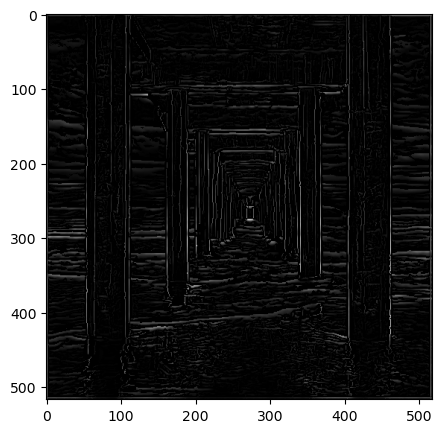

In [15]:
nms_image = nms(g_mag, g_theta)
print('NMS:')
plt.imshow(nms_image, cmap=cm.gray)
plt.show()

### Problem 2.4 Hysteresis Thresholding [8 pts]
Choose suitable values of thresholds and use the thresholding approach decribed in lecture 6. This will remove the edges caused by noise and color variations.

  - Define two thresholds `t_min` and `t_max`. 
  - If the `nms > t_max`, then we select that pixel as an edge.
  - If `nms < t_min`, we reject that pixel.
  - If `t_min < nms < t_max`, we select the pixel only if there is a path from/to another pixel with `nms > t_max`. (Hint: Think of all pixels with `nms > t_max` as starting points and run BFS/DFS from these starting points).
  - The choice of value of low and high thresholds depends on the range of values in the gradient magnitude image. You can start by setting the high threshold to some percentage of the max value in the gradient magnitude image, e.g. thres_high = 0.2 * image.max(), and the low threshold to some percentage of the high threshold, e.g. thres_low = 0.85 * thres_high. And then you can tune those values however you want.

A good initial value to use is thres_high = 0.25 * image.max() amd thres_low = 0.25 * thres_high

In [16]:
# strong --> 255
# weak  --> 10
# irrevalent --> 0

# given a coordinate of a weak pixel, is there a path to get to the string pixel
def path_finder(coordinate, m):
    assert m[coordinate[0], coordinate[1]] == 10
    height, width = m.shape
    visted = np.zeros((height, width), dtype = bool)
    directions = [(1, 0), (-1, 0), (0, -1), (0, 1), 
                  (-1, -1), (-1, 1), (1, -1), (1, 1)]
    pixel_stack = [coordinate]
    while len(pixel_stack) != 0:
        i, j = pixel_stack.pop()
        # if found 255, return True
        if m[i, j] == 255:
            return True
        # visted or blocked --> continue
        if (m[i, j] == 0) or (visted[i, j]):
            continue
        # mark i, j as visted
        visted[i, j] = True
        for delta_i, delta_j in directions:
            if (0 <= i + delta_i < height) and (0 <= j + delta_j < width):
                pixel_stack.append((i + delta_i, j + delta_j))
    return False


def hysteresis_threshold(image, g_theta, use_g_theta=False):
    """ ==========
    YOUR CODE HERE
    ========== """
    image = image.astype('uint8')
    results = np.zeros_like(image, dtype = 'uint8')
    threshold = np.zeros_like(image, dtype = 'uint8')
    height, width = image.shape
    
    # create threshold
    thres_high = 0.2 * image.max()
    thres_low = 0.85 * thres_high
    
    for i in range(2, height - 2):
        for j in range(2, width - 2):
            if (image[i, j] >= thres_high):
                threshold[i, j] = 255
            elif (thres_low <= image[i, j] < thres_high):
                threshold[i, j] = 10
            else:
                threshold[i, j] = 0
    
    threshold_copy = copy.deepcopy(threshold)
    
    for i in range(height):
        for j in range(width):
            if threshold[i, j] != 10:
                results[i, j] = threshold[i, j]
            else:
                if path_finder((i, j), threshold_copy):
                    results[i, j] = 255
                else:
                    results[i, j] = 0
                    
    return results

Thresholded:


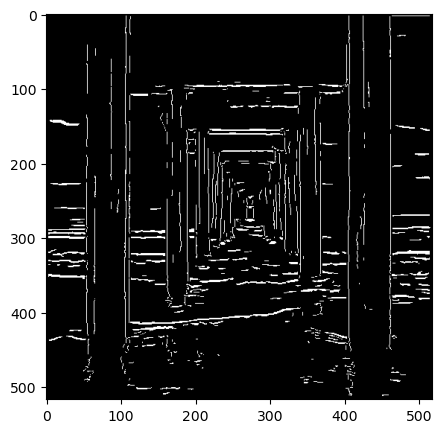

In [17]:
thresholded = hysteresis_threshold(nms_image, g_theta)
print('Thresholded:')
plt.imshow(thresholded, cmap=cm.gray)
plt.show()

## Problem 3 Corner detection [13 pts]

### Problem 3.1 [12 pts]
In this problem, we are going to build a corner detector. This should be done according to the lecture slides. You should fill in the function <code>corner_detect</code> below, which takes as input <code>image, nCorners, smoothSTD, windowSize</code> -- where `smoothSTD` is the standard deviation of the smoothing kernel and `windowSize` is the window size for corner detector and non-maximum suppression. In the lecture, the corner detector was implemented using a hard threshold. Do not do that; instead, return the `nCorners` strongest corners after non-maximum suppression. This way you can control exactly how many corners are returned. Run your code on all four images (with `nCorners` = 20) and display outputs as shown below. You may find `scipy.ndimage.filters.gaussian_filter` helpful for smoothing.

In this problem, try the following different standard deviation ($\sigma$) parameters for the Gausian smoothing kernel: 0.5, 1, 2 and 4. For a particular $\sigma$, you should take the kernel size to be $6\times\sigma$ (add $1$ if the kernel size is even). So for example if $\sigma=2$, corner detection kernel size should be $13$. This should be followed throughout all of the experiments in this assignment.

There will be a total of 24 images as outputs: 4 choices of `smoothSTD` x (2 `dino` + 2 `matrix` + 2 `warrior` images).

<!--- ![dinoCorner1](dinoCorner1.png) --->
<!--- The previous results in export to pdf errors on some systems but the following does not --->
<img src="dinoCorner1.png">
<!--- ![dinoCorner2](dinoCorner2.png) --->
<!--- The previous results in export to pdf errors on some systems but the following does not --->
<img src="dinoCorner2.png">

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import imageio.v2 as imageio
from scipy.signal import convolve
import scipy.ndimage as sciimg

def rgb2gray(rgb):
    """ Convert rgb image to grayscale.
    """
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

In [19]:
def get_spatial_matrix(fx, fy):
    assert fx.shape == fy.shape
    height, width = fx.shape
    temp00 = np.sum(fx * fx)
    temp01 = np.sum(fx * fy)
    temp11 = np.sum(fy * fy)
    res = np.array([[temp00, temp01],
                    [temp01, temp11]])    
    return res



# given a matrix, find the lambda_min
def get_lambda_min(m):
    trace_value = np.trace(m)
    det_value = np.linalg.det(m)
    temp = np.sqrt(max([0, (trace_value**2) - (4*det_value) ]))
    return (trace_value - temp) / 2



# given a 2d matrix, find the indices of top n values
def top_n_indices(m, n):
    flat = m.flatten()
    sorted_indices = np.argsort(flat)
    top_indices = sorted_indices[-n:]
    x, y = np.unravel_index(top_indices, m.shape)
    x = np.reshape(x, (n, 1))
    y = np.reshape(y, (n, 1))
    # y means row and x means columns
    return np.concatenate([y, x], axis = 1)


def corner_detect(image, nCorners, smoothSTD, windowSize):
    """Detect corners on a given image.

    Args:
        image: Given a grayscale image on which to detect corners.
        nCorners: Total number of corners to be extracted.
        smoothSTD: Standard deviation of the Gaussian smoothing kernel.
        windowSize: Window size for corner detector and non-maximum suppression.

    Returns:
        Detected corners (in image coordinate) in a numpy array (n*2).

    """
    
    """ ==========
    YOUR CODE HERE
    ========== """
    
    height, width = image.shape
    
    # copy image
    img = copy.deepcopy(image)
    
    # gaussian smoothing
    gaussian_kernel = gaussian2d(sig=smoothSTD)
    img = conv(img, gaussian_kernel)
    
    # calculate gradient
    x_derivative_kernel = np.array([[-1/2, 0, 1/2]])
    x_derivative_kernel = np.flip(np.flip(x_derivative_kernel, axis=0), axis=1)
    y_derivative_kernel = np.array([[-1/2], [0], [1/2]])
    y_derivative_kernel = np.flip(np.flip(y_derivative_kernel, axis=0), axis=1)
    # use valid and then do padding
    Gx = convolve(img, x_derivative_kernel, mode='valid') ; Gx = zero_pad(Gx, 0, 0, 1, 1)
    Gy = convolve(img, y_derivative_kernel, mode='valid') ; Gy = zero_pad(Gy, 1, 1, 0, 0)
    assert Gx.shape == Gy.shape
    
    # pad Gx and Gy again for spatial matrix
    pad_size = int(windowSize / 2)
    Gx = zero_pad(Gx, pad_size, pad_size, pad_size, pad_size)
    Gy = zero_pad(Gy, pad_size, pad_size, pad_size, pad_size)
    
    # calculate measurement matrix
    R = np.zeros((height, width))
    for i in range(height):
        for j in range(width):
            centeri = i + pad_size ; centerj = j + pad_size
            gx_window = Gx[centeri - pad_size : centeri + pad_size + 1, 
                           centerj - pad_size : centerj + pad_size + 1]
            gy_window = Gy[centeri - pad_size : centeri + pad_size + 1, 
                           centerj - pad_size : centerj + pad_size + 1]
            R[i, j] = get_lambda_min( get_spatial_matrix(gx_window, gy_window) )
    
    # NMS 
    # do not using padding for this
    J = np.zeros((height, width))
    for i in range(windowSize, height - windowSize):
        for j in range(windowSize, width - windowSize):
            window = R[i - pad_size : i + pad_size + 1, 
                       j - pad_size : j + pad_size + 1]
            if R[i, j] >= window.max():
                J[i, j] = R[i, j]
    corners = top_n_indices(J, nCorners)
    return corners

smooth stdev: 0.5
window size: 3


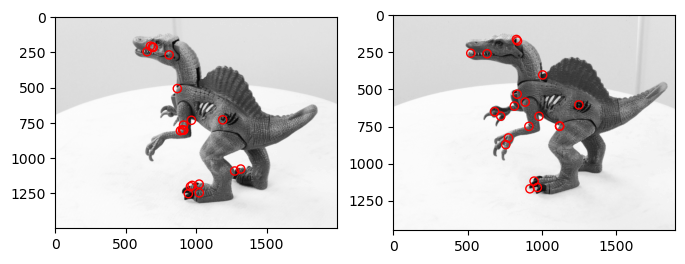

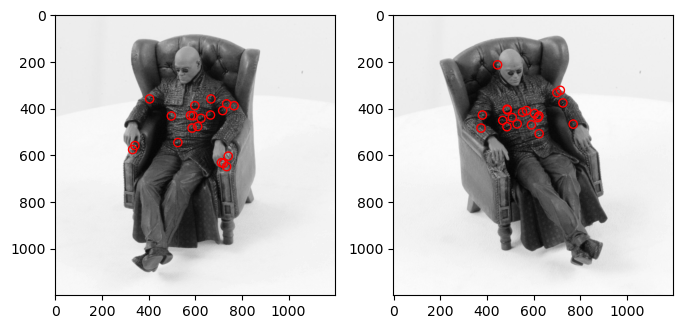

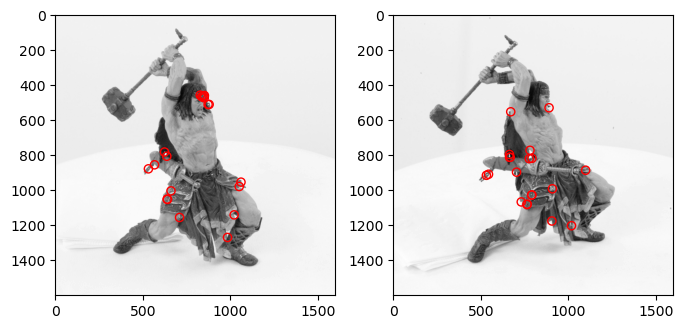

smooth stdev: 1
window size: 7


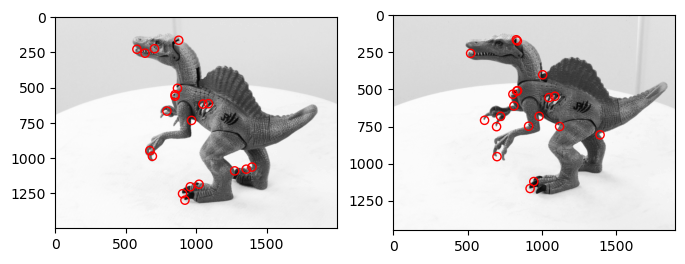

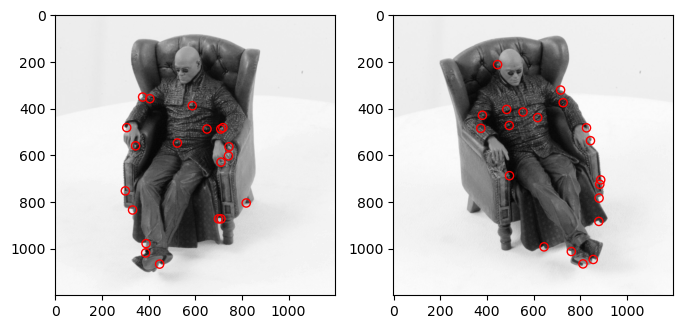

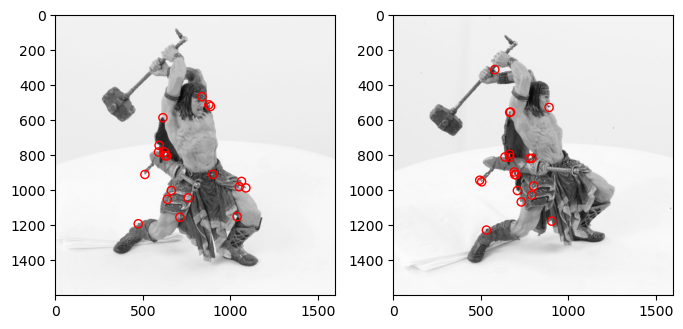

smooth stdev: 2
window size: 13


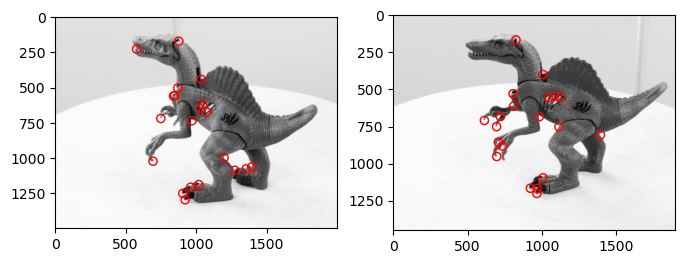

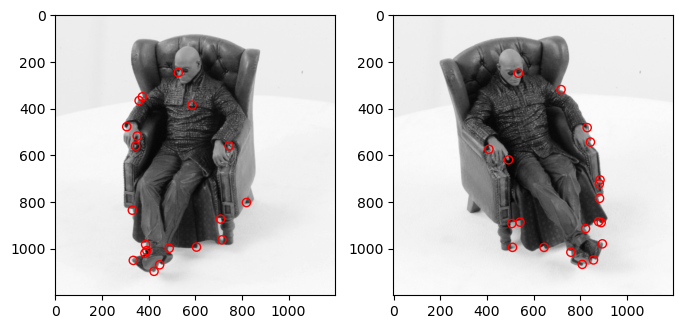

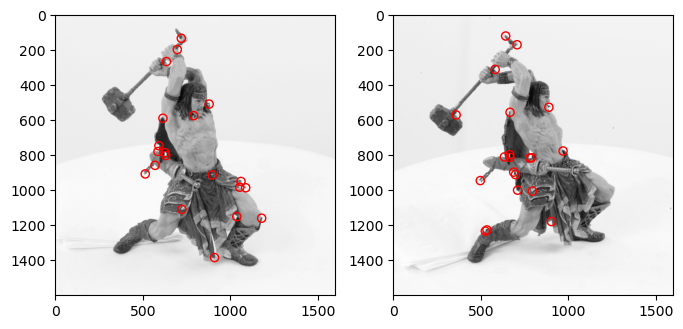

smooth stdev: 4
window size: 25


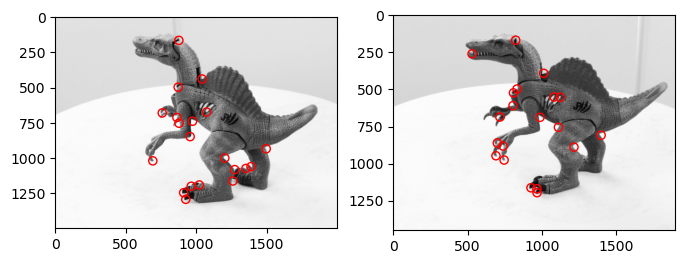

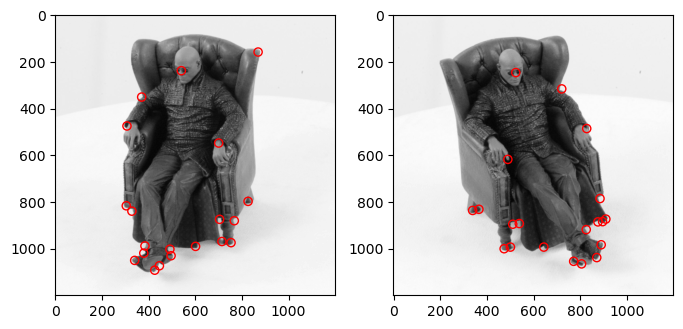

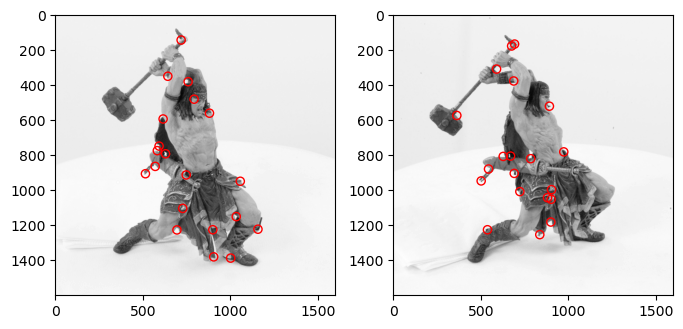

In [20]:
def show_corners_result(imgs, corners):
    fig = plt.figure(figsize=(8, 8))
    ax1 = fig.add_subplot(221)
    ax1.imshow(imgs[0], cmap='gray')
    ax1.scatter(corners[0][:, 0], corners[0][:, 1], s=35, edgecolors='r', facecolors='none')

    ax2 = fig.add_subplot(222)
    ax2.imshow(imgs[1], cmap='gray')
    ax2.scatter(corners[1][:, 0], corners[1][:, 1], s=35, edgecolors='r', facecolors='none')
    plt.show()

for smoothSTD in (0.5, 1, 2, 4):
    windowSize = int(smoothSTD * 6)
    if windowSize % 2 == 0:
        windowSize += 1
        
    print('smooth stdev: %r' % smoothSTD)
    print('window size: %r' % windowSize)

    nCorners = 20

    # read images and detect corners on images
    
    imgs_din = []
    crns_din = []
    imgs_mat = []
    crns_mat = []
    imgs_war = []
    crns_war = []
    
    for i in range(2):
        img_din = imageio.imread('dino/dino' + str(i) + '.png')
        imgs_din.append(rgb2gray(img_din))
        # downsize your image in case corner_detect runs slow in test
        # imgs_din.append(rgb2gray(img_din)[::2, ::2])
        crns_din.append(corner_detect(imgs_din[i], nCorners, smoothSTD, windowSize))

        img_mat = imageio.imread('matrix/matrix' + str(i) + '.png')
        imgs_mat.append(rgb2gray(img_mat))
        # downsize your image in case corner_detect runs slow in test
        # imgs_mat.append(rgb2gray(img_mat)[::2, ::2])
        crns_mat.append(corner_detect(imgs_mat[i], nCorners, smoothSTD, windowSize))

        img_war = imageio.imread('warrior/warrior' + str(i) + '.png')
        imgs_war.append(rgb2gray(img_war))
        # downsize your image in case corner_detect runs slow in test
        # imgs_war.append(rgb2gray(img_war)[::2, ::2])
        crns_war.append(corner_detect(imgs_war[i], nCorners, smoothSTD, windowSize))

    show_corners_result(imgs_din, crns_din)
    show_corners_result(imgs_mat, crns_mat)
    show_corners_result(imgs_war, crns_war)

### Problem 3.2 [1 pts]
Comment on your results and observations. You don't need to comment per output; just discuss any trends you see for the detected corners as you change the windowSize and increase the smoothing w.r.t the two pairs of images (warrior and matrix). Also discuss whether you are able to find corresponding corners for the pairs of images.

####  `smoothSTD` and `windowSize`
1. As `windowSize` increases, more corners can be detected. Large `windowSize` can avoid detecting corners that are too close to each other.

2. As `smoothSTD` increases, there is no obvious impact for corner detection.

#### Discussing Results for Corresponding Corners
I can find some pairs of corresponding corners, but not all of them. I think this is because that images are taken from different angles, therefore, detected angles are also different.

## Problem 4 Epipolar rectification and feature matching [43 pts]

### 4.1 Epipolar rectification [22 pts]

In this problem, we are going to perform epipolar rectification. Given calibrated stereo cameras (i.e., calibration matrices $K_1$ and $K_2$, camera rotation matrices $R_1$ and $R_2$, camera translation vectors $t_1$ and $t_2$), you are expected to determine the rotation matrix $R$ and calibration matrix $K$ of the virtual cameras.
Your goal is to complete the function <code>epipolarRecification</code>, which determines the calibration matrix and rotation matrix of both cameras, the translation vector of each of the cameras, and matching planar transformations that epipolar rectify the two images acquired by the cameras. The destination virtual cameras have the same centers as the source real cameras. 


#### 4.1.1 Camera translation matrices and Projective Transformation matrices [6 pts]
To calculate the camera translation from cameras with the same camera center, you will have to complete the <code>cameraTranslation</code> first. 
Another function you need to complete is <code>calcProjectiveTransformation</code>, which calculates the planar projective transformation from cameras with the same camera center.
The camera calibration matrix (same for both cameras) will be calculated by <code>calcDestinateK</code>. This is provided for you.
To get the rotation matrix $R$ of the virtual camera, we usually interpolate halfway between the two 3D rotations embodied by $R_1$ and $R_2$. For simplicity, this will be also given to you.

In [21]:
from imageio.v2 import imread
import matplotlib.pyplot as plt
import numpy as np
import math
import pickle
from math import floor, ceil

In [22]:
def cameraTranslation(R_real, t_real, R_virt):
    '''
    Calculate the camera translation of virtual camera from real camera with the same camera center.
    
    Args: 
    R_real: The rotation matrix of the real camera.
    t_real: The translation vector of the real camera.
    R_virt: The rotation matrix of the virtual camera.
    
    Returns:
    The translation vector of the virtual camera.
    '''
    """ ==========
    YOUR CODE HERE
    ========== """
    temp = np.matmul(R_virt, R_real.T)
    temp = np.matmul(temp, t_real)
    return temp

In [23]:
def calcProjectiveTransformation(K_real, R_real, K_virt, R_virt):
    '''
    Calculates the planar projective transformation from cameras with the same camera center.
    This function determines the planar projective transformation from the image of a 3D point in the real 
    camera to its image in the virtual camera 
    where P_real = K_real * R_real * [I | -C] and P_virt = K_virt * R_virt * [I | -C].
    
    Args:
    K_real: The calibration matrix of the real camera.
    R_real: The rotation matrix of the real camera.
    K_virt: The calibration matrix of the virtual camera.
    R_virt: The rotation matrix of the virtual camera.
    
    Returns:
    The transformation matrix.
    '''
    """ ==========
    YOUR CODE HERE
    ========== """
    temp = np.matmul(K_virt, R_virt)
    temp = np.matmul(temp, R_real.T)
    temp = np.matmul(temp, np.linalg.inv(K_real))
    return temp

In [24]:
def calcDestinateK(srcK1, srcK2):
    '''
    Camera calibration matrix (same for both cameras)
    '''
    alpha = (srcK1[0][0] + srcK2[0][0] + srcK1[1][1] + srcK2[1][1]) // 4 
    x0 = (srcK1[0][2] + srcK2[0][2]) // 2
    y0 = (srcK1[1][2] + srcK2[1][2]) // 2
    dstK = np.zeros((3, 3))
    dstK[0][0] = alpha
    dstK[0][2] = x0
    dstK[1][1] = alpha
    dstK[1][2] = y0
    dstK[2][2] = 1
    return dstK

In [25]:
import scipy.linalg
import math
def calcDestinateR(srcR1, srcR2,src_t1,src_t2):
    '''
    interpolate between two rotation matrices
    '''
    
    # Rotation matrix that is half way between srcR1 and srcR2
    Rinterp = scipy.linalg.expm(0.5*scipy.linalg.logm(srcR2@srcR1.T))@srcR1
    
    # Rotation matrix to compose with above rotation matrix such that relative camera translation vector is aligned with the X-axis
    u = cameraTranslation( srcR2, src_t2,Rinterp ) - cameraTranslation( srcR1, src_t1, Rinterp)
    vhat = np.array([[1],[0],[0]])

    if 0 > u.T@vhat:
        #Unit vector along negative X-axis instead, so that the images are not upside down
        vhat[0] = -1
        
    # The 3-vector 'axis' defines an axis and theta is the rotation about the axis.
    theta =  math.acos((u.T@vhat)[0,0]/np.linalg.norm(u))
    axis = np.cross(u.reshape(-1),vhat.reshape(-1))
    
    # The angle-axis representation is a 3-vector omega where the norm of omega is theta and the unitized omega is the unit vector representing the axis of rotation.
    omega = (theta/np.linalg.norm(axis))*axis
    omega = omega.reshape(-1)

    # omega_x is the skew symmetric matrix form of omega
    omega_x  = np.array([[0, -omega[2], omega[1]], 
                         [omega[2], 0, -omega[0]], 
                         [-omega[1], omega[0], 0]])
    
    
    R_x = scipy.linalg.expm(omega_x)
    dstR = R_x@Rinterp
    
    return dstR

In [26]:
def epipolarRecification(srcK1, srcR1, src_t1, 
                         srcK2, srcR2, src_t2):
    '''
    Given two calibrated cameras, this function determines the calibration matrix and rotation matrix of both cameras, the translation vector of each of the cameras, and matching planar transformations that epipolar rectify the two image acquired by the cameras.  The destination cameras have the same centers as the source cameras.
    
    Args:
    srcK1: The calibration matrix of the first source camera.
    srcR1: The rotation matrix of the first source camera.
    src_t1: The translation vector of the first source camera.
    srcK2: The calibration matrix of the second source camera.
    srcR2: The rotation matrix of the second source camera.
    src_t2: The translation vector of the second source camera.
    
    Returns: 
    dstK: The calibration matrix of the virtual cameras.
    dst_t1: The translation vector of the first virtual camera.
    dst_t2: The translation vector of the second virtual camera.
    H1, H2: The image rectification transformation matrices.
    '''
    dstR = calcDestinateR(srcR1, srcR2,src_t1,src_t2)
    
    dst_t1 = cameraTranslation(srcR1, src_t1, dstR)
    dst_t2 = cameraTranslation(srcR2, src_t2, dstR)
    
    dstK = calcDestinateK(srcK1, srcK2)
    
    H1 = calcProjectiveTransformation(srcK1, srcR1, dstK, dstR)
    H2 = calcProjectiveTransformation(srcK2, srcR2, dstK, dstR)
   
    return dstK, dst_t1, dst_t2, H1, H2

#### Problem 4.1.2 Warp Image [10 pts]
After calling <code>epipolarRectification</code>, we can get the projective transformation matrices $H1$ and $H2$. Next, we will geometrically transform (i.e., 'warp') the image so that the epipolar lines are image rows. You have to complete <code>warpImage</code> using the backward method in Lecture 7. Note the destination images are required to be the same size as the source images.

In [27]:
# helper functions

# given floating points coordinates, how to interpolate to integers
def interpolate_coordinates(x, y):
    return round(x), round(y)

# convert to homog points
def to_homog(points): 
    # convert points from inhomogeneous to homogeneous
    # 
    # inputs: 
    # points is a dxn matrix where n is the number of d dimensional inhomogeneous points 
    # (e.g., d = 3 for 3D inhomogeneous points)
    #
    # outputs:
    # homo_points is a (d+1)xn matrix of n d-dimensional homogeneous points
    
    # write your code here
    _ , n = points.shape
    ones_vector = np.ones((1, n))
    homo_points = np.concatenate((points, ones_vector), axis = 0)
    return homo_points


# converts to inhomog points
def from_homog(points_homog):
    # convert points from homogeneous to inhomogeneous
    # 
    # inputs:
    # points_homog is a (d+1)xn matrix of n d-dimensional homogeous points (e.g., d = 2 
    # for 2D homogeneous points)
    #
    # outputs:
    # inhomo_points is a dxn matrix of n d-dimensional inhomogeous points 
    
    # write your code here
    last_row = points_homog[-1,:]
    temp = points_homog / last_row
    inhomog_points = temp[:-1, :]
    return inhomog_points

In [28]:
def warpImage(image, H, out_height, out_width):
    """
    Performs the warp of the full image content.
    Calculates bounding box by piping four corners through the transformation.
    
    Args: 
    image: Image to warp
    H: The image rectification transformation matrices.
    out_height, out_width: The shape of output image.
    
    Returns:
    Out: An inverse warp of the image, given a homography.
    min_x, min_y, max_x, max_y: The minimum/maxmum of warped image bound.
    """
    """ ==========
    YOUR CODE HERE
    ========== """
    
    # calculate inv(H)
    Hi = np.linalg.inv(H)
    
    # define output images
    out = np.zeros((out_height, out_width, 3))
    
    in_height, in_width, _ = image.shape
    
    for i in range(out_height):
        for j in range(out_width):
            
            # convert to image coordinate
            x_virt = j; y_virt = i
            
            # form inhomog coordinates
            X_virt_inhomo = np.array([[x_virt],[y_virt]])
            
            # get virtual homog coordinates
            X_virt_homo = to_homog(X_virt_inhomo)
            
            # get real homog coordinates
            X_real_homo = np.matmul(Hi, X_virt_homo)
            
            # get real inhomog coordinates
            X_real_inhomo = np.squeeze(from_homog(X_real_homo))
            
            #get x_real and y_real
            x_real = X_real_inhomo[0] ; y_real = X_real_inhomo[1]
            
            # interpolate 
            x_real, y_real = interpolate_coordinates(x_real, y_real)
            if (0 <= x_real < in_width) and (0 <= y_real < in_height):
                out[y_virt, x_virt] = image[y_real, x_real]
    out = out.astype('uint8')
    
    # using forward mappings for warped image bound
    
    xreal_inhomo = np.array([[0, in_width - 1, 0, in_width - 1],
                             [0, 0, in_height - 1, in_height - 1]])
    xreal_homo = to_homog(xreal_inhomo)
    xvirt_homo = np.matmul(H, xreal_homo)
    xvirt_inhomo = from_homog(xvirt_homo)
    
    xs = xvirt_inhomo[0, :] ; ys = xvirt_inhomo[-1, :]
    min_x = round(xs.min()) ; max_x = round(xs.max())
    min_y = round(ys.min()) ; max_y = round(ys.max())
    
    return out, min_x, min_y, max_x, max_y

In [29]:
file_param = open('param.pkl', 'rb')
param = pickle.load(file_param)
file_param.close()
srcK1, srcR1, src_t1 = param['srcK1'], param['srcR1'], param['src_t1']
srcK2, srcR2, src_t2 = param['srcK2'], param['srcR2'], param['src_t2']


In [30]:
dstK, dst_t1, dst_t2, H1, H2 = epipolarRecification(srcK1, srcR1, src_t1, 
                                                    srcK2, srcR2, src_t2)

Original image 1:


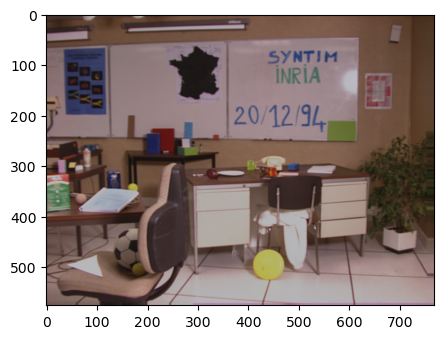

In [31]:
src1 = imread('Sport0_OG0.bmp')
plt.imshow(src1)
print('Original image 1:')

Unbounded Rectified image 1:


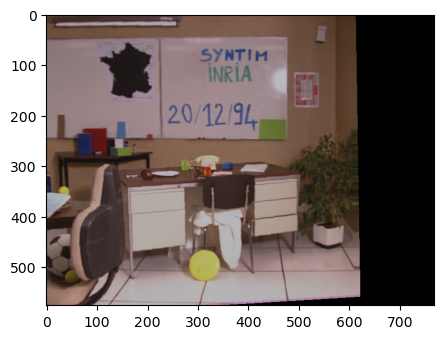

In [32]:
height1, width1, _ = src1.shape
rectified_im1_unbounded, min_x1, min_y1, max_x1, max_y1 = warpImage(src1, H1, height1, width1)
plt.imshow(rectified_im1_unbounded)
print('Unbounded Rectified image 1:')

Original image 2:


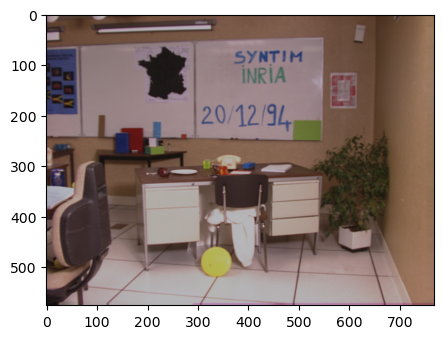

In [33]:
src2 = imread('Sport1_OG0.bmp')
plt.imshow(src2)
print('Original image 2:')

Unbounded Rectified image 2:


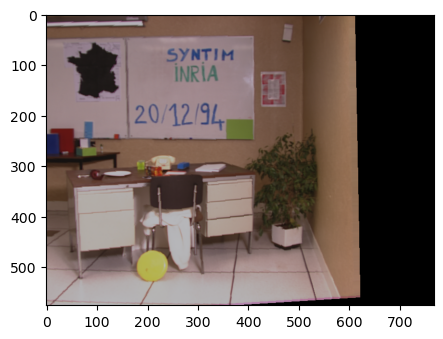

In [34]:
height2, width2, _ = src2.shape
rectified_im2_unbounded, min_x2, min_y2, max_x2, max_y2 = warpImage(src2, H2, height2, width2)
plt.imshow(rectified_im2_unbounded)
print('Unbounded Rectified image 2:')

##### Verification
The following code verifies two rectified images

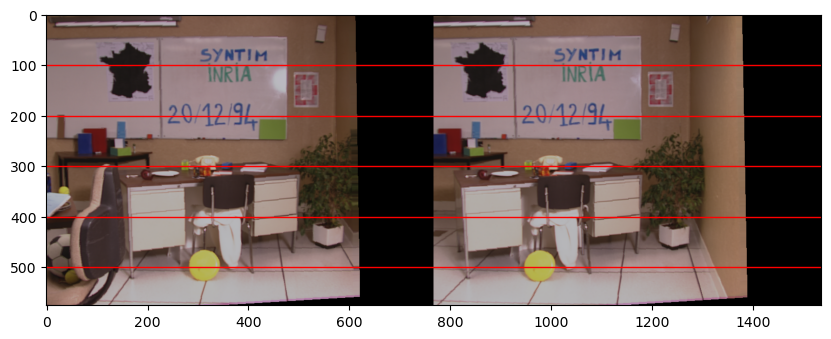

In [35]:
img1 = rectified_im1_unbounded
img2 = rectified_im2_unbounded
img3 = np.concatenate((img1, img2), axis = 1)
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img3)
x1 = 0 ; x2 = img3.shape[1] - 1
y1 = 100 ; y2 = 200 ; y3 = 300 ; y4 = 400 ; y5 = 500 
ax.plot([x1, x2], [y1, y1], color='red', linewidth=1)
ax.plot([x1, x2], [y2, y2], color='red', linewidth=1)
ax.plot([x1, x2], [y3, y3], color='red', linewidth=1)
ax.plot([x1, x2], [y4, y4], color='red', linewidth=1)
ax.plot([x1, x2], [y5, y5], color='red', linewidth=1)

#### 4.1.3 Partial bounded retification [3 pts]
In the resulting images, although they are epipolar rectified, you should observe portions of the source images being transformed "out of bounds" of the destination images.
To fix this problem, we can introduced a 2D transformation containing a translation (i.e., $T1$ and $T2$). 
$$T1 = \begin{bmatrix}
1 & 0 & -min\_x1 - 0.5\\ 
0 & 1 & -min(min\_y1, min\_y2) - 0.5\\ 
0 & 0 & 1
\end{bmatrix}$$
$$T2 = \begin{bmatrix}
1 & 0 & -min\_x2 - 0.5\\ 
0 & 1 & -min(min\_y1, min\_y2) - 0.5\\ 
0 & 0 & 1
\end{bmatrix}$$
$H1$, $H2$ can be updated by left multiplying $T1$, $T2$, respectivley. Again, geometrically tranform the images under the updated $H1$, $H2$. The destination image is required to be the same size as the source images. In the resulting images, although they are (still) epipolar rectified, you should observe the portions of the source images being transformed are no longer "out of bounds" on the top and left of the destination images.

In [36]:
def partialboundedRetification(min_x1, min_y1, min_x2, min_y2, H1, H2):
    '''
    Update the projective transformation matries so that the rectified images are no longer 'out of bound'. 
    '''
    """ ==========
    YOUR CODE HERE
    ========== """
    T1 = np.array([[1, 0, -1 * (min_x1 + 0.5)],
                   [0, 1, -1 * min([min_y1, min_y2]) - 0.5], 
                   [0, 0, 1]])
    
    T2 = np.array([[1, 0, -1 * (min_x2 + 0.5)],
                   [0, 1, -1 * min([min_y1, min_y2]) - 0.5], 
                   [0, 0, 1]])
    
    H1_bounded = np.matmul(T1, H1)
    H2_bounded = np.matmul(T2, H2)
    
    return H1_bounded, H2_bounded

The partial bounded rectified image 1:


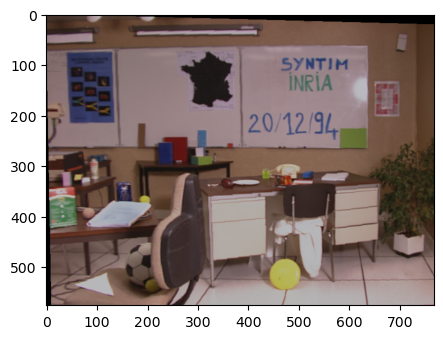

In [37]:
H1_bounded, H2_bounded = partialboundedRetification(min_x1, min_y1, min_x2, min_y2, H1, H2)
rectified_im1_bounded, min_x1_bounded, min_y1_bounded, max_x1_bounded, max_y1_bounded = warpImage(src1, H1_bounded, 
                                                                                                  height1, width1)
plt.imshow(rectified_im1_bounded)
print('The partial bounded rectified image 1:')

The partial bounded rectified image 2:


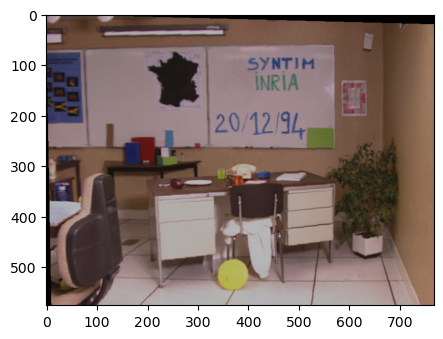

In [38]:
rectified_im2_bounded, min_x2_bounded, min_y2_bounded, max_x2_bounded, max_y2_bounded = warpImage(src2, H2_bounded,
                                                                                                  height2, width2)
plt.imshow(rectified_im2_bounded)
print('The partial bounded rectified image 2:')

##### Verification

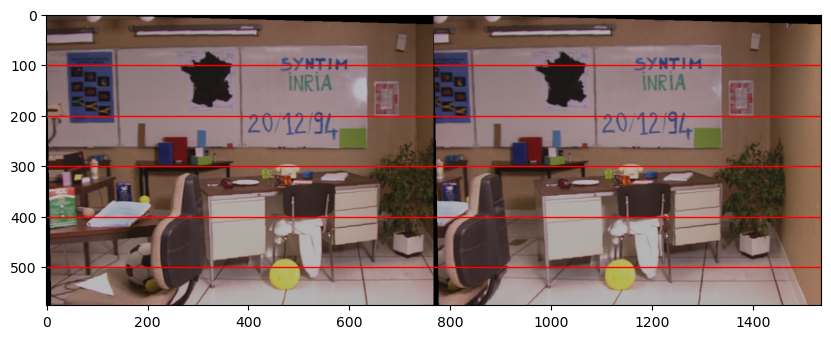

In [39]:
img1 = rectified_im1_bounded
img2 = rectified_im2_bounded
img3 = np.concatenate((img1, img2), axis = 1)
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img3)
x1 = 0 ; x2 = img3.shape[1]-1
y1 = 100 ; y2 = 200 ; y3 = 300 ; y4 = 400 ; y5 = 500 
ax.plot([x1, x2], [y1, y1], color='red', linewidth=1)
ax.plot([x1, x2], [y2, y2], color='red', linewidth=1)
ax.plot([x1, x2], [y3, y3], color='red', linewidth=1)
ax.plot([x1, x2], [y4, y4], color='red', linewidth=1)
ax.plot([x1, x2], [y5, y5], color='red', linewidth=1)

#### 4.1.4 Completely bounded rectification [3 pts]
Finally, determine the size of the destination images that completely bound the transformed images. 


 $$dst1Width = int( x1max - x1min + 1 )$$
 $$dst2Width = int( x2max - x2min + 1 )$$
 $$dstHeight = int(max( y1max, y2max ) - min( y1min, y2min ) + 1 )$$
   
   
 Again geometrically transform the images under the updated 2D projective transformation matrices $H1$ and $H2$ (these are not updated a second time). You should complete the function <code>completelyBoundedRectification</code>. The destination images are required to be the size you just calculated. In the resulting images, you should observe the source images being transformed such that they are epipolar rectified and are completely bounded.

In [40]:
def completelyBoundedRectification(src1, src2, 
                                   H1_bounded, H2_bounded,
                                   min_x1_bounded, max_x1_bounded, min_y1_bounded, max_y1_bounded,
                                   min_x2_bounded, max_x2_bounded, min_y2_bounded, max_y2_bounded):
    '''
    Determine the size of the destination images (same size for both) that completely 
    bound the transformed images. geometrically transform the images under the updated 2D projective 
    transformation matrices H1 and H2 (these are not updated a second time).
    '''
    """ ==========
    YOUR CODE HERE
    ========== """
    out1Width = int(max_x1_bounded - min_x1_bounded + 1)
    out2Width = int(max_x2_bounded - min_x1_bounded + 1)
    outHeight = int(max([max_y1_bounded, max_y2_bounded]) - min([min_y1_bounded, min_y2_bounded]) + 1)
    rectified_im1_final, _, _, _, _ = warpImage(src1, H1_bounded, outHeight, out1Width)
    rectified_im2_final, _, _, _, _ = warpImage(src2, H2_bounded, outHeight, out2Width)
    return rectified_im1_final, rectified_im2_final

In [41]:
rectified_im1_final, rectified_im2_final = completelyBoundedRectification(src1, src2, H1_bounded, H2_bounded, 
                                                                          min_x1_bounded, max_x1_bounded,
                                                                          min_y1_bounded, max_y1_bounded,
                                                                          min_x2_bounded, max_x2_bounded,
                                                                          min_y2_bounded, max_y2_bounded)

##### Verification

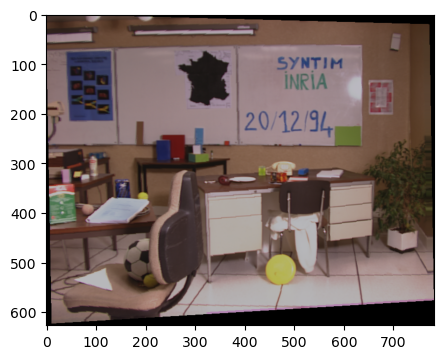

In [42]:
plt.imshow(rectified_im1_final)

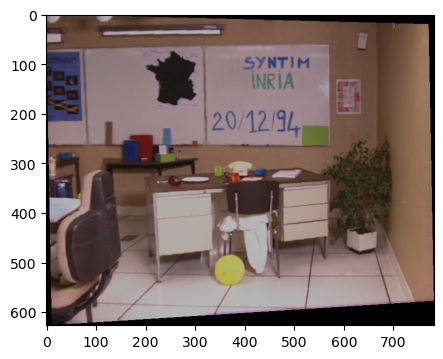

In [43]:
plt.imshow(rectified_im2_final)

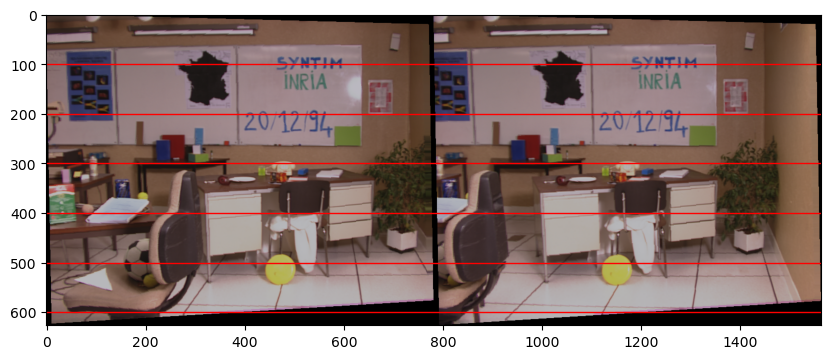

In [44]:
img1 = rectified_im1_final
img2 = rectified_im2_final
img3 = np.concatenate((img1, img2), axis = 1)
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img3)
x1 = 0 ; x2 = img3.shape[1]-1
y1 = 100 ; y2 = 200 ; y3 = 300 ; y4 = 400 ; y5 = 500 ; y6 = 600
ax.plot([x1, x2], [y1, y1], color='red', linewidth=1)
ax.plot([x1, x2], [y2, y2], color='red', linewidth=1)
ax.plot([x1, x2], [y3, y3], color='red', linewidth=1)
ax.plot([x1, x2], [y4, y4], color='red', linewidth=1)
ax.plot([x1, x2], [y5, y5], color='red', linewidth=1)
ax.plot([x1, x2], [y6, y6], color='red', linewidth=1)

### Problem 4.2 Feature matching [4 pts]
#### 4.2.1 SSD (Sum Squared Distance) Matching [1 pts]
Complete the function <code>ssdMatch</code>:  
SSD = $\sum_{x,y}|W_1(x,y)-W_2(x,y)|^2$

In [45]:
def ssdMatch(img1, img2, c1, c2, R):
    """Compute SSD given two windows.
    
    Args:
        img1: Image 1.
        img2: Image 2.
        c1: Center (in image coordinate) of the window in image 1.
        c2: Center (in image coordinate) of the window in image 2.
        R: R is the radius of the patch, 2 * R + 1 is the window size

    Returns:
        SSD matching score for two input windows.
        
    """
    """ ==========
    YOUR CODE HERE
    ========== """
    c1j, c1i = tuple(c1)
    c2j, c2i = tuple(c2)
    window1 = img1[c1i - R:c1i + R + 1, c1j - R:c1j + R + 1]
    window2 = img2[c2i - R:c2i + R + 1, c2j - R:c2j + R + 1]
    temp = np.subtract(window1, window2)
    temp = np.square(temp)
    matching_score = np.sum(temp)
    return matching_score

In [46]:
# Here is the code for you to test your implementation
img1 = np.array([[1, 2, 7, 3], [2, 8, 5, 7], [3, 2, 7, 0]])
img2 = np.array([[4, 3, 3, 4], [4, 6, 8, 5], [3, 8, 9, 4]])
print(ssdMatch(img1, img2, np.array([1, 1]), np.array([1, 1]), 1))
# should print 83
print(ssdMatch(img1, img2, np.array([2, 1]), np.array([2, 1]), 1))
# should print 91
print(ssdMatch(img1, img2, np.array([1, 1]), np.array([2, 1]), 1))
# should print 113

83
91
113


#### Problem 4.2.2 NCC (Normalized Cross-Correlation) Matching [2 pts]

Write a function <code>ncc_match</code> that implements the NCC matching algorithm for two input windows.

NCC = $\sum_{i,j}\tilde{W_1} (i,j)\cdot \tilde{W_2} (i,j)$

where $\tilde{W} = \frac{W - \overline{W}}{\sqrt{\sum_{k,l}(W(k,l) - \overline{W})^2}}$ is a mean-shifted and normalized version of the window and $\overline{W}$ is the mean pixel value in the window W.

In [47]:
def normalize_window(window):
    _mean = np.mean(window)
    _stdev = np.sqrt(np.sum((window - _mean) ** 2))
    return (window - _mean) / (_stdev + 1e-6)

def ncc_match(img1, img2, c1, c2, R):
    """Compute NCC given two windows.

    Args:
        img1: Image 1.
        img2: Image 2.
        c1: Center (in image coordinate) of the window in image 1.
        c2: Center (in image coordinate) of the window in image 2.
        R: R is the radius of the patch, 2 * R + 1 is the window size

    Returns:
        NCC matching score for two input windows.

    """
    
    """ ==========
    YOUR CODE HERE
    ========== """
    c1j, c1i = tuple(c1)
    c2j, c2i = tuple(c2)
    window1 = img1[c1i - R:c1i + R + 1, c1j - R:c1j + R + 1]
    window2 = img2[c2i - R:c2i + R + 1, c2j - R:c2j + R + 1]
    w1bar = normalize_window(window1)
    w2bar = normalize_window(window2)
    temp = np.multiply(w1bar, w2bar)
    return np.sum(temp)
    

In [48]:
# test NCC match
img1 = np.array([[1, 2, 7, 3], [2, 8, 5, 7], [3, 2, 7, 0]])
img2 = np.array([[4, 3, 3, 4], [4, 6, 8, 5], [3, 8, 9, 4]])

print (ncc_match(img1, img2, np.array([1, 1]), np.array([1, 1]), 1))
# should print 0.338

print (ncc_match(img1, img2, np.array([2, 1]), np.array([2, 1]), 1))
# should print 0.250

print (ncc_match(img1, img2, np.array([1, 1]), np.array([2, 1]), 1))
# should print 0.0498

0.338080521919092
0.25005290998739566
0.0498764779064851


#### Problem 4.2.3  [1 pts]

**i.  Which feature matching algorithm do you think is better to use between SSD and NCC?**  
NCC is better since the normalization can lead to more robust matching for varying light conditions.


**ii. Give a scenario where your answer in part i would result in better matches.**  
When dealing with time-seris related images, NCC should have a better result. For images taken at different times, light conditions and illumination vary, therefore, NCC is more robust.

### Problem 4.3 Naive Matching [8 pts]

Equipped with the corner detector and the NCC matching function, we are ready to start finding correspondences. NCC matching radius (R in the code below) is the radius of the NCC patch of size $2\times R+1$. One naive strategy is to try and find the best match between the two sets of corner points. Write a script that does this, namely, for each corner in image1, find the best match from the detected corners in image2 (or, if the NCC match score is too low, then return no match for that point). You will have to figure out a good threshold (NCCth) value by experimentation.

Write a function <code>naive_matching</code> and call it as below. Examine your results for 10, 20, and 30 detected corners in each image. Choose the number of detected corners to maximize the number of correct matching pairs. <code>naive_matching</code> will call your NCC matching code.

**Properly label or mention which output corresponds to which choice of number of corners. The total number of outputs is 6 images:** (3 choices of number of corners for each of `matrix` and `warrior`), where each figure might look like the following:

**Number of corners: 10**
<img src = "dinoMatch.png" alt="dino match" width="800"/>

In [49]:
# detect corners on warrior and matrix sets
# you are free to modify code here, create your helper functions, etc.

# define hyperparameters
smoothSTD = 1
windowSize = 17
nCorners10 = 10  
nCorners20 = 20
nCorners30 = 30

# read images


# read images and detect corners on images
img_mat0 = imageio.imread('matrix/matrix' + str(0) + '.png') ; img_mat0 = rgb2gray(img_mat0)
img_mat1 = imageio.imread('matrix/matrix' + str(1) + '.png') ; img_mat1 = rgb2gray(img_mat1)
img_war0 = imageio.imread('warrior/warrior' + str(0) + '.png') ; img_war0 = rgb2gray(img_war0)
img_war1 = imageio.imread('warrior/warrior' + str(1) + '.png') ; img_war1 = rgb2gray(img_war1)

# get corners 
mat0_corners30 = corner_detect(img_mat0, nCorners30, smoothSTD, windowSize)
mat1_corners30 = corner_detect(img_mat1, nCorners30, smoothSTD, windowSize)
war0_corners30 = corner_detect(img_war0, nCorners30, smoothSTD, windowSize)
war1_corners30 = corner_detect(img_war1, nCorners30, smoothSTD, windowSize)

mat0_corners10 = mat0_corners30[-1 * nCorners10:]
mat1_corners10 = mat1_corners30[-1 * nCorners10:]
war0_corners10 = war0_corners30[-1 * nCorners10:]
war1_corners10 = war1_corners30[-1 * nCorners10:]

mat0_corners20 = mat0_corners30[-1 * nCorners20:]
mat1_corners20 = mat1_corners30[-1 * nCorners20:]
war0_corners20 = war0_corners30[-1 * nCorners20:]
war1_corners20 = war1_corners30[-1 * nCorners20:]

In [50]:
def naive_matching(img1, img2, corners1, corners2, R, NCCth):
    """Compute NCC given two windows.

    Args:
        img1: Image 1.
        img2: Image 2.
        corners1: Corners in image 1 (nx2)
        corners2: Corners in image 2 (nx2)
        R: NCC matching radius
        NCCth: NCC matching score threshold

    Returns:
        NCC matching result a list of tuple (c1, c2), 
        c1 is the 1x2 corner location in image 1, 
        c2 is the 1x2 corner location in image 2. 

    """
    assert corners1.shape == corners2.shape
    nCorners, _ = corners1.shape
    matching = []
    
    for i in range(nCorners):
        c1 = corners1[i]
        match_scores = []
        for j in range(nCorners):
            c2 = corners2[j]
            match_scores.append( ncc_match(img1, img2, np.squeeze(c1), np.squeeze(c2), R) )
        max_value = max(match_scores)
        max_index = match_scores.index(max_value)
        if max_value >= NCCth:
            matching.append( (c1, corners2[max_index]) )
    
    return matching

In [51]:
# match corners
R = 16
NCCth = 0.65  # put your threshold here

matching_mat10 = naive_matching(img_mat0 / 255, img_mat1 / 255, mat0_corners10, mat1_corners10, R, NCCth)
matching_mat20 = naive_matching(img_mat0 / 255, img_mat1 / 255, mat0_corners20, mat1_corners20, R, NCCth)
matching_mat30 = naive_matching(img_mat0 / 255, img_mat1 / 255, mat0_corners30, mat1_corners30, R, NCCth)

matching_war10 = naive_matching(img_war0 / 255, img_war1 / 255, war0_corners10, war1_corners10, R, NCCth)
matching_war20 = naive_matching(img_war0 / 255, img_war1 / 255, war0_corners20, war1_corners20, R, NCCth)
matching_war30 = naive_matching(img_war0 / 255, img_war1 / 255, war0_corners30, war1_corners30, R, NCCth)

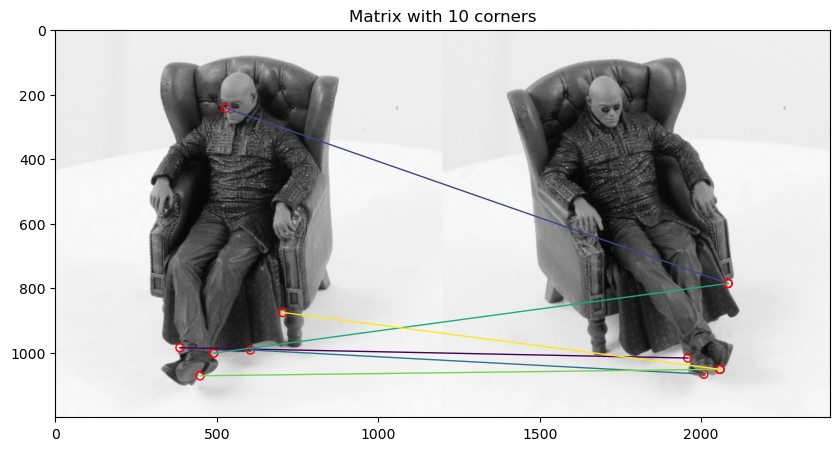

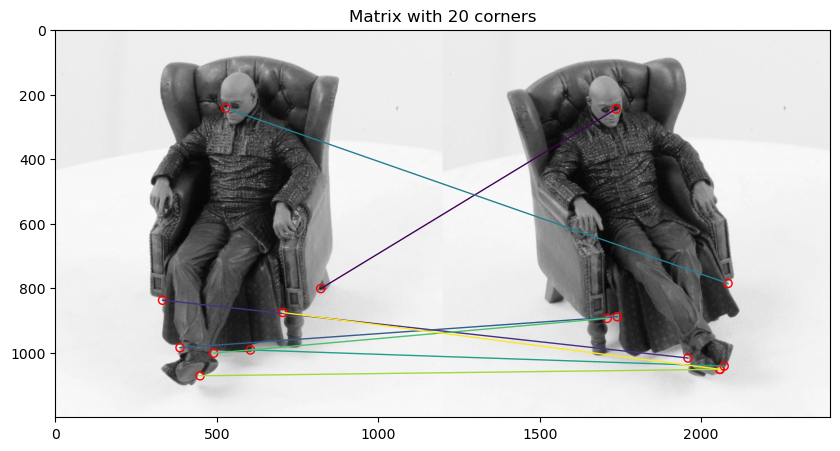

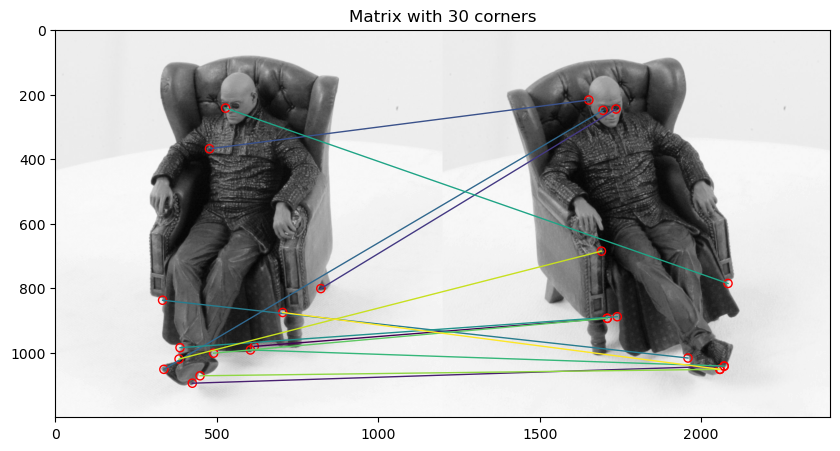

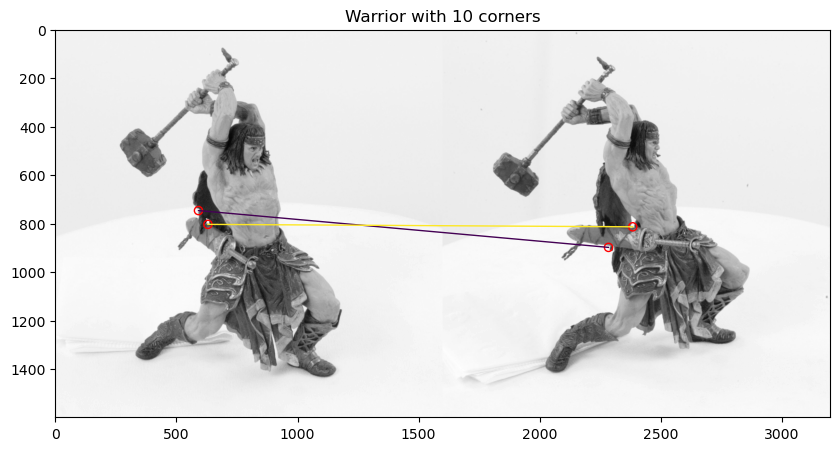

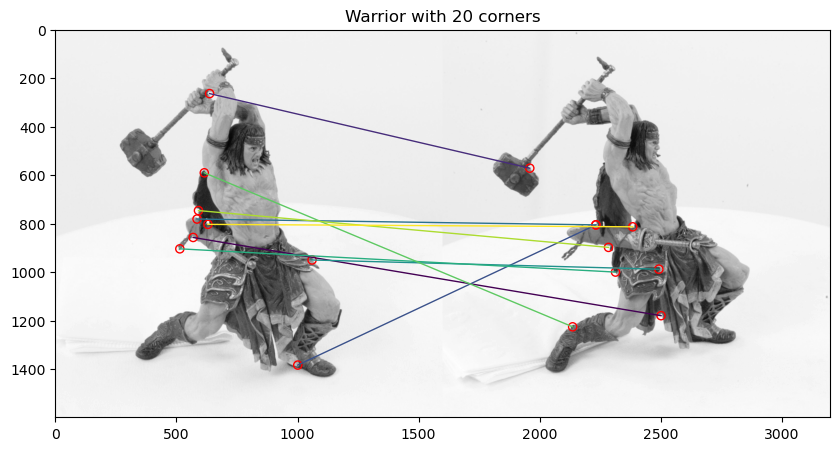

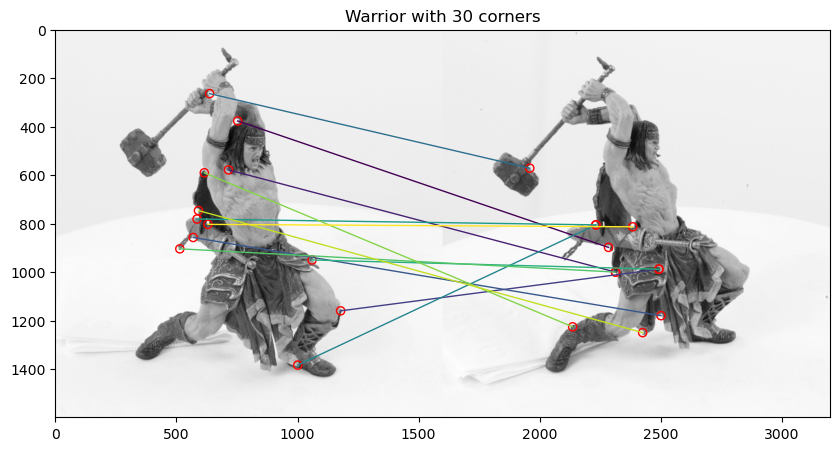

In [52]:
# plot matching result

def show_matching_result(img1, img2, matching, title):
    """ ==========
    YOUR CODE HERE
    ========== """
    
    # difine different colors
    cmap = plt.cm.viridis
    colors = cmap(np.linspace(0, 1, len(matching)))
    
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow( np.concatenate((img1, img2), axis = 1) , cmap = 'gray' )
    
    if len(img1.shape) == 2:
        _, width = img1.shape
    else:
        _, width, _ = img1.shape
    
    for idx, match in enumerate(matching):
        x1, y1 = tuple(match[0])
        x2, y2 = tuple(match[1])
        ax.scatter([x1, x2 + width], [y1, y2], s=35, edgecolors='r', facecolors='none')
        ax.plot([x1, x2 + width], [y1, y2], color=colors[idx], linewidth=1)
    
    ax.set_title(title)
    
    
show_matching_result(img_mat0, img_mat1, matching_mat10, f"Matrix with {nCorners10} corners")
show_matching_result(img_mat0, img_mat1, matching_mat20, f"Matrix with {nCorners20} corners")
show_matching_result(img_mat0, img_mat1, matching_mat30, f"Matrix with {nCorners30} corners")

show_matching_result(img_war0, img_war1, matching_war10, f"Warrior with {nCorners10} corners")
show_matching_result(img_war0, img_war1, matching_war20, f"Warrior with {nCorners20} corners")
show_matching_result(img_war0, img_war1, matching_war30, f"Warrior with {nCorners30} corners")

### Problem 4.4 Matching using epipolar geometry [10 pts]
Next, we will use the epipolar geometry constraint on the rectified images and updated corner points to build a better matching algorithm. First, detect 10 corners in image1. Then, for each corner, do a line search along the corresponding parallel epipolar line in image2.

Evaluate the NCC score for each point along this line and return the best match (or no match if all scores are below the NCCth). R is the radius (size) of the NCC patch in the code below.

You do not have to run this in both directions. Show your result as in the naive matching part. 

In [53]:
# prepare images

# rectify images
rectified_im1_final, rectified_im2_final = completelyBoundedRectification(src1, src2, H1_bounded, H2_bounded,
                                                                          min_x1_bounded, max_x1_bounded, 
                                                                          min_y1_bounded, max_y1_bounded,
                                                                          min_x2_bounded, max_x2_bounded,
                                                                          min_y2_bounded, max_y2_bounded)
# replace black pixels with white pixels
_black_idxs = (rectified_im1_final[:, :, 0] == 0) & (rectified_im1_final[:, :, 1] == 0) & (rectified_im1_final[:, :, 2] == 0)
rectified_im1_final[:, :][_black_idxs] = [255, 255, 255]
_black_idxs = (rectified_im2_final[:, :, 0] == 0) & (rectified_im2_final[:, :, 1] == 0) & (rectified_im2_final[:, :, 2] == 0)
rectified_im2_final[:, :][_black_idxs] = [255, 255, 255]

# generate grayscale image
img1 = rgb2gray(rectified_im1_final)
img2 = rgb2gray(rectified_im2_final)

In [54]:
# find corners
nCorners10 = 10
nCorners20 = 20
nCorners30 = 30
windowSize = 17
smoothSTD = 1

# detect corners using corner detector here, store in corners1
corners30 = corner_detect(img1, nCorners30, smoothSTD, windowSize)
corners10 = corners30[-1 * nCorners10:]
corners20 = corners30[-1 * nCorners20:]

In [55]:
def correspondence_matching_epipole(img1, img2, corners1, R, NCCth):
    """Find corner correspondence along epipolar line.

    Args:
        img1: Image 1 (Rectified)
        img2: Image 2 (Rectified)
        corners1: Detected corners in image 1.
        R: NCC matching window radius.
        NCCth: NCC matching threshold.
    
    Returns:
        Matching result to be used in display_correspondence function
    """
    
    """ ==========
    YOUR CODE HERE
    ========== """
    _, width = img2.shape
    nCorners, _ = corners1.shape
    
    matching = []
    
    for i in range(nCorners):
        c1 = corners1[i] ; _, y = tuple(c1)
        match_scores = [] ; c2s = []
        for x in range(R, width - R):
            c2 = np.array([[x, y]]) ; c2s.append(c2)
            match_scores.append( ncc_match(img1, img2, np.squeeze(c1), np.squeeze(c2), R) )
        max_value = max(match_scores)
        max_index = match_scores.index(max_value)
        if max_value >= NCCth:
            matching.append( (np.squeeze(c1), np.squeeze(c2s[max_index])) )
    return matching

In [56]:
# find matchings

# Choose your threshold and NCC matching window radius
NCCth = 0.6
R = 8
match10= correspondence_matching_epipole(img1, img2, corners10, R, NCCth)
match20= correspondence_matching_epipole(img1, img2, corners20, R, NCCth)
match30= correspondence_matching_epipole(img1, img2, corners30, R, NCCth)

In [57]:
def display_correspondence(img1, img2, corrs, title):
    """Plot matching result on image pair given images and correspondences

    Args:
        img1: Image 1.
        img2: Image 2.
        corrs: Corner correspondence
    """
    
    """ ==========
    YOUR CODE HERE
    You may want to refer to the `show_matching_result` function.
    ========== """
    show_matching_result(img1, img2, corrs, title)

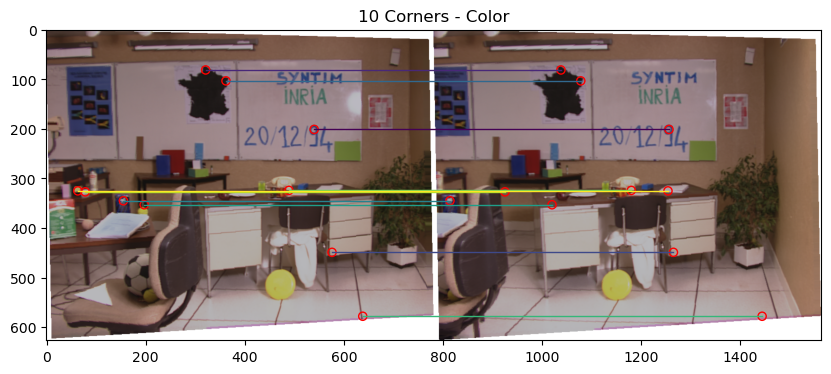

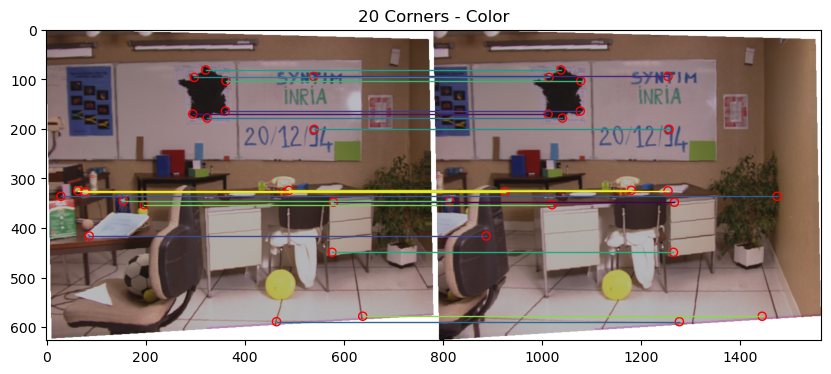

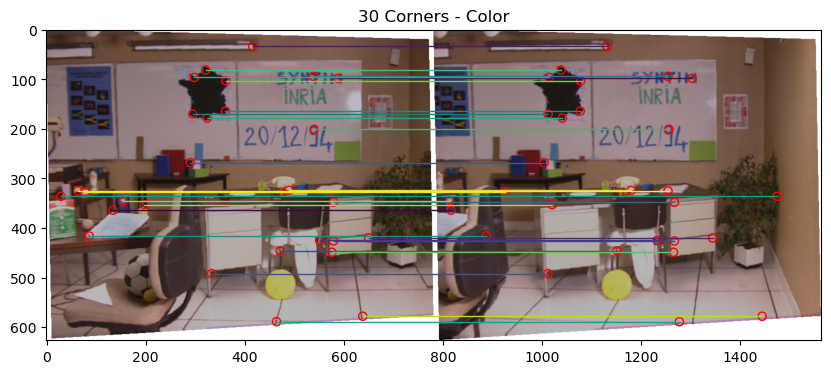

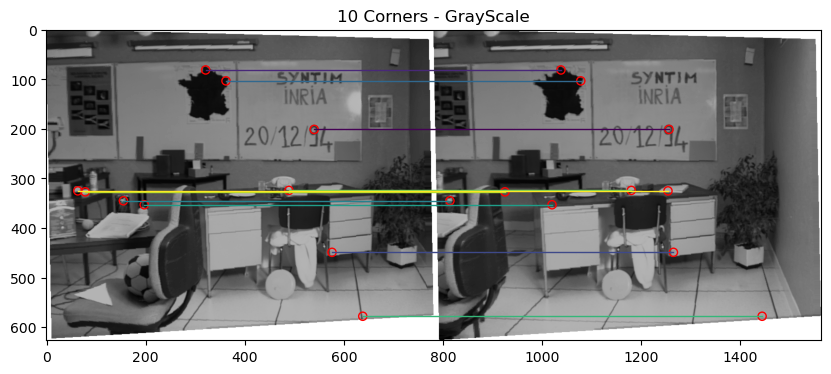

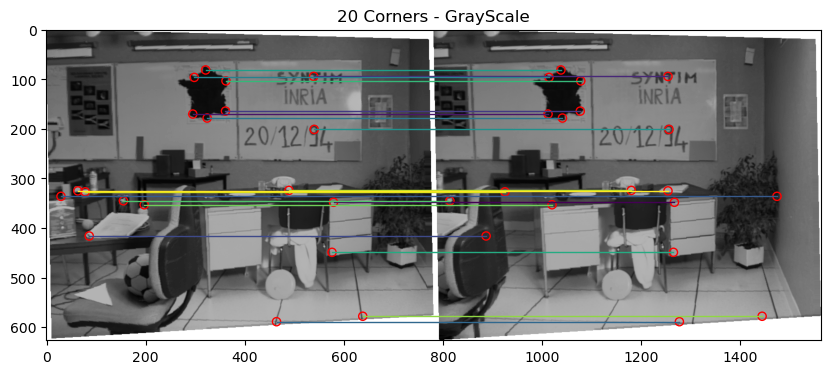

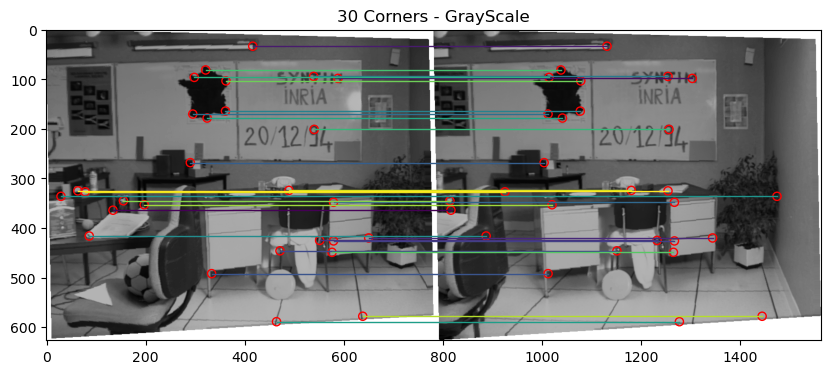

In [58]:
# display matchings

display_correspondence(rectified_im1_final, rectified_im2_final, match10, "10 Corners - Color")
display_correspondence(rectified_im1_final, rectified_im2_final, match20, "20 Corners - Color")
display_correspondence(rectified_im1_final, rectified_im2_final, match30, "30 Corners - Color")

display_correspondence(img1, img2, match10, "10 Corners - GrayScale")
display_correspondence(img1, img2, match20, "20 Corners - GrayScale")
display_correspondence(img1, img2, match30, "30 Corners - GrayScale")